In [90]:
using ComputationalHeatTransfer
using LaTeXStrings
using Revise
using LinearAlgebra
using DifferentialEquations
using Interpolations
using JLD2


cd(dirname(pwd()))
cd("src") 
includet("OneDOHP.jl")
using ..OneDOHP

In [91]:
using Plots
gr()  

Plots.GRBackend()

## turned on boiling, plate thickness=1mm, Hliquid = Hvapor = 1/100 original

# the plate code initialization

### Physical parameters

In [1311]:
ρ = 2700;
c = 8.97e02;
k = 1.67e02;
# d = 2e-3;
d = 1e-3;
params = HeatConductionParameters(ρ,c,k,thickness=d)

HeatConductionParameters(2700.0, 897.0, 167.0, 6.895412692514142e-5, 0.001)

### Geometry parameters

In [1312]:
inch = 2.54e-2;
Lx = 0.1524;
Ly = 0.0648;

In [1313]:
xlim = (-Lx/2,Lx/2) .*1.0
ylim = (-Ly/2,Ly/2) .*1.0
Δx, Δt = setstepsizes(params.α,gridPe=8.0,fourier=0.3)


(0.0005516330154011314, 0.001323919236962715)

### Set up the evaporator and condenser

In [1314]:
eb1 = Rectangle(0.5inch,1.0inch,1.5*Δx)
Te = RigidTransform((0.7inch,-0.0),0.0)
Te(eb1)

eb2 = Rectangle(0.5inch,1.0inch,1.5*Δx)
Te = RigidTransform((-0.7inch,-0.0),0.0)
Te(eb2)

cb1 = Rectangle(0.5inch*0.9,Ly*0.9/2,1.5*Δx)
Tc = RigidTransform((-2.5inch,-0.0),0.0)
Tc(cb1)

cb2 = Rectangle(0.5inch*0.9,Ly*0.9/2,1.5*Δx)
Tc = RigidTransform((2.5inch,-0.0),0.0)
Tc(cb2)

qe = 15500.0
hc = 1500.0
Tc = 0.0

eparams1 = PrescribedHeatFluxRegion(qe,eb1);
eparams2 = PrescribedHeatFluxRegion(qe,eb2);
cparams1 = PrescribedHeatModelRegion(hc,Tc,cb1);
cparams2 = PrescribedHeatModelRegion(hc,Tc,cb2);

### Set up the OHP

In [1315]:
ds = 1.5Δx
nturn = 16
#pitch = 0.125
length_ohp = 46.25*1e-3
height = 133.83*1e-3
gap = d
pitch = length_ohp/(2*nturn+1)
x0, y0 = height/2, length_ohp/2
x, y, xf, yf = ComputationalHeatTransfer.construct_ohp_curve(nturn,pitch,height,gap,ds,x0,y0,false,false,3pi/2)
ohp = BasicBody(x,y)


Basic pointwise-specified body with 5598 points
   Current position: (0.0,0.0)
   Current angle (rad): 0.0


In [1316]:
# gap = 1e-2
# x0_one, y0_one = (0.0, 0.0)
# x, y, xf, yf = construct_oneloop_curve(x0_one,y0_one,ds,height,gap,0.0)
# ohp = BasicBody(x,y)

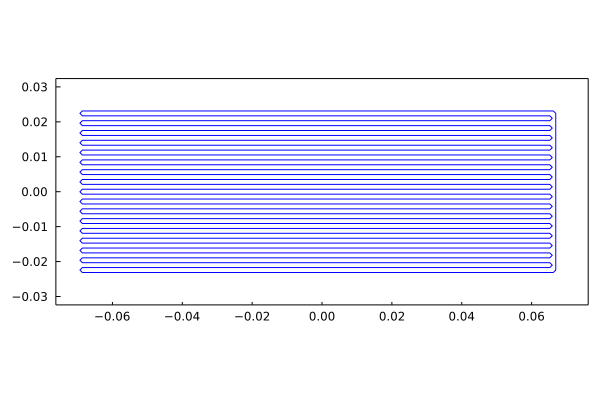

In [1317]:
plot(ohp,fillalpha=0,linecolor=:blue,xlims=xlim,ylims=ylim,framestyle = :box)

In [1318]:
ohpgeom = ComputationalHeatTransfer.LineSourceParams(ohp)
qtmp = zeros(numpts(ohp));

### Create the system

In [1319]:
sys = HeatConduction(params,Δx,xlim,ylim,Δt,qline=ohpgeom,qflux=[eparams1,eparams2],qmodel=[cparams1,cparams2])
#sys = HeatConduction(params,Δx,xlim,ylim,Δt,qline=ohpgeom)

Unbounded Heat conduction system on a grid of size 280 x 120 and 0 static immersed points


### Initialize state, and create the integrator

In [1320]:
u0 = newstate(sys)
tspan = (0.0,1.0)
integrator = init(u0,tspan,sys);
Tn = temperature(integrator);

### Set up values for the OHP heat flux per unit length and advance the solution

In [1321]:
fill!(qtmp,-0.0)
set_linesource_strength!(sys,qtmp)

Unbounded Heat conduction system on a grid of size 280 x 120 and 0 static immersed points


### Time marching

In [1322]:
num = 1000
ΔN = 100


Thist=[]

@time for i = 1:num
    Tn = ADI_timemarching!(Tn,sys,Δt)
    
    if mod(i,ΔN) == 0
        push!(Thist,deepcopy(Tn))
    end
end

 11.130252 seconds (228.06 k allocations: 13.121 GiB, 22.57% gc time)


### Plotting temperature contours

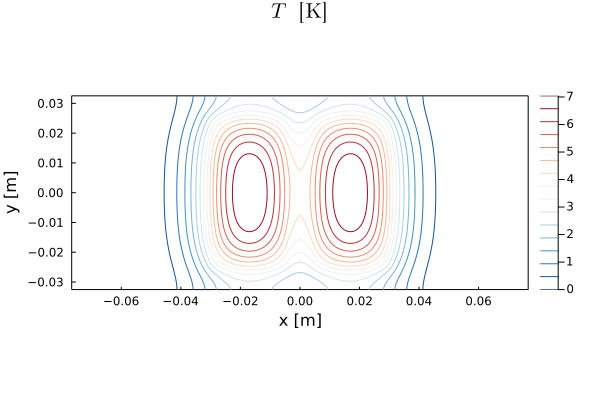

In [1323]:
plot(Tn,sys.grid,legend=true,color=cgrad(:RdBu,rev=true),line_z=0,xlabel="x [m]",ylabel="y [m]",title=L"T \quad [\mathrm{K}]")

### Plot the temperature along the OHP channel

In [1324]:
# plot(sys.qline[1].arccoord,temperature_linesource(integrator),xlabel=L"\xi",ylabel=L"T - T_0")

# OHP inner part

In [1325]:
nondi_Q_to_Q = 1.35E+02
t_to_nondi_t = 2.83E-01
function di_T_to_nondi_T(di_T;T0=295.0) 
    
    (di_T+T0)/T0
    
end



di_T_to_nondi_T (generic function with 1 method)

In [1423]:
    ω = sqrt(2.45E+03);
    ℘L = 2.05E+05;
    k = 0.106024683

    θinitial=1.0
    θc = 1.0; # useless

    Hwc = 0.0; #not useful later on. H between wall and condenser, 
#     Hₗ   =  1600.0; # liquid wall heat transfer coeffcient
#     Hₗ   =  1.01E+03; # liquid wall heat transfer coeffcient for static fluids
    hₗ = 4.62e2 # Nusselt number 4.36
    Hₗ = 4*hₗ*d/(μₗ*Cpₗ)

    Hδ  = 4.65E+02;


# # use a smaller heat  transfer coefficient for the tube because it contacts the plate with one side.
#     Hₗ = Hₗ # liquid wall heat transfer coeffcient for static fluids
#     Hδ = Hδ # vapor film heat transfer coeffcient * thickness for static fluids

In [1424]:
    nondi_diameter = 6.56e-3 # dimensionless diameter
    L = 2.0 + gap*pi/height  # total length of the pipe when streched to a 1D pipe
    L = 34.35  # total length of the pipe when streched to a 1D pipe
    L2D = 1.0 # the actual length of the bended pipe in the real world
    angle = 0*pi/2 # inclination angle 
    ΔTthres = 0.3/295.0; # use a small threshold
    closedornot = true

true

In [1425]:
    nucleatenum = 256
    Xstations = sort(rand(nucleatenum).*L);
#     Xstations = LinRange(0.0,L-L/nucleatenum,nucleatenum)
#     boilingΔt = 0.05

In [1426]:
tube = Tube(nondi_diameter,L,L2D,angle,ΔTthres,closedornot);

In [1427]:
# useless
Xe = map(tuple, [1.0], [3.0])
We = [0.0]
evap = Evaporator(Xe,We);

In [1428]:
# useless
Xc = map(tuple, [0.0,3.0], [1.0,4.0])
cond = Condenser(θc,Xc,Hwc);

In [1453]:
X0,realratio = randomXp(L,numofslugs=60,chargeratio=0.45)
# X0 = [(L/2,L/2 + 1.0)]

dXdt0_l = zeros(length(X0))
dXdt0_r = zeros(length(X0))
dXdt0 = map(tuple,dXdt0_l,dXdt0_r)


# construct liquids
N=numpts(ohp)

ρ = 102.593344 # density ratio
Xarrays,θarrays = constructXarrays(X0,N,θinitial,L)
liquids=Liquid(Hₗ,ρ,ω,℘L,X0,dXdt0,Xarrays,θarrays);


In [1454]:
realratio

0.4826189869011764

In [1455]:
# P = [1.0,1.0,1.0,1.0,1.0]; # closed end

γ = 1.4;
# Hδ = 4.64E+02
P = 0*zeros(length(X0)) .+ 1.0;
δ = 0*zeros(length(X0)) .+ 2.0E-01;
# δ = 0*zeros(length(X0)) .+ 2.78E-02;
# δ = 0*zeros(length(X0)) .+ 2.78E-02 .* 10; # use a random film thickness
vapors=Vapor(γ,Hδ,P,δ);

In [1456]:
α = 1.154e-5 # nondimensional thermal diffusivity = (αₐ d^2) / (νₗ height^2)
# Xwallarray,θwallarray = constructXarrays(L,N,θinitial)
Xwallarray,θwallarray = constructXarrays(sys.qline[1].arccoord,L,θinitial)
θwallarray = di_T_to_nondi_T(temperature_linesource(integrator));

wall = Wall(α,Δt,Xstations,Xwallarray,θwallarray);

In [1457]:
sys0_nomapping = PHPSystem_nomapping(tube,evap,cond,liquids,vapors,wall);
θ_interp_walltoliquid, θ_interp_liquidtowall, H_interp_liquidtowall, P_interp_liquidtowall = sys_interpolation(sys0_nomapping)
mapping = Mapping(θ_interp_walltoliquid, θ_interp_liquidtowall, H_interp_liquidtowall, P_interp_liquidtowall);

In [1458]:
sys0 = PHPSystem(tube,evap,cond,liquids,vapors,wall,mapping);

### construct state vector U

In [1459]:
Lvaporplug = XptoLvaporplug(X0,sys0.tube.L,sys0.tube.closedornot)
M = nondi_PtoD(P) .* Lvaporplug
# M = P.^(1/γ).* Lvaporplug


u=[XMδtovec(X0,dXdt0,M,δ); liquidθtovec(sys0.liquid.θarrays)];

In [1460]:
cb_boiling =  DiscreteCallback(boiling_condition,boiling_affect!)
# cb_boiling =  PeriodicCallback(boiling_affect!,0.01*t_to_nondi_t)
cb_merging =  DiscreteCallback(merging_condition,merging_affect!)

cbst = CallbackSet(cb_boiling,cb_merging);

# combine inner tube and plate together

In [1461]:
tspan = (0.0, 300.0);
dt_record = tspan[2] /150;

tstep=1e-3

N_iter = 1
# tstep_plate = tstep/N_iter
# dt_record = tstep

1

In [1462]:
u0 = newstate(sys)
integrator_plate = init(u0,tspan,sys)
# Tplate = temperature(integrator_plate);
# temperature(integrator_plate) .+= 1.0;

In [1463]:
p = sys0
u=[XMδtovec(X0,dXdt0,M,δ); liquidθtovec(sys0.liquid.θarrays)];
prob = ODEProblem(ODE_innertube, u, tspan, p)
integrator_tube = init(prob, RK4(),save_everystep=false, dt=tstep*t_to_nondi_t, callback=cbst);

In [1464]:
plate_hist = []
tube_hist  = []

currentsys = integrator_tube.p
currentsys = getcurrentsys(integrator_tube.u,currentsys);

In [1465]:

@time for t in tspan[1]:tstep:tspan[2]
    

  for j in 1:N_iter
        currentsys.wall.θarray = di_T_to_nondi_T(temperature_linesource(integrator_plate))
        currentsys = getcurrentsys(integrator_tube.u,currentsys)


        nondi_qtmp = sys_to_heatflux(currentsys)
        qtmp = nondi_Q_to_Q*nondi_qtmp
        set_linesource_strength!(sys,qtmp)


     ADI_timemarching!(temperature(integrator_plate),sys,tstep)
    end
    integrator_plate.t += tstep
    
    # reinitialize the integrator_tube to avoid some mysterious problems
    prob = ODEProblem(ODE_innertube, deepcopy(integrator_tube.u), (integrator_plate.t*t_to_nondi_t-tstep*t_to_nondi_t,integrator_plate.t*t_to_nondi_t), currentsys)
    integrator_tube = init(prob, RK4(), callback=cbst, dt=tstep*t_to_nondi_t);
#     step!(integrator_tube);
    step!(integrator_tube,tstep*t_to_nondi_t,true);

    if (mod(integrator_plate.t,dt_record) < 1e-6) || (mod(-integrator_plate.t,dt_record) < 1e-6)
        push!(plate_hist,deepcopy(integrator_plate)); 
        push!(tube_hist,deepcopy(integrator_tube));
        println(integrator_plate.t)
    end
    
end

Boiled! at 1.4254238981028526 on 0.10000000000000007
Boiled! at 9.401539575429307 on 0.10000000000000007
Boiled! at 26.59508810631563 on 0.20000000000000015
1.9999999999998905
Boiled! at 9.452124085667503 on 2.6999999999998137
3.9999999999996705
Boiled! at 27.709545375771995 on 5.200000000000071
6.000000000000338
Boiled! at 1.3313740795549318 on 6.200000000000405
Boiled! at 27.41456015702441 on 6.500000000000505
8.000000000001005
Boiled! at 26.630472094413758 on 8.600000000000673
9.999999999999897
Boiled! at 27.390763429074966 on 10.999999999999343
Boiled! at 31.353931647678703 on 11.399999999999121
Boiled! at 10.70764981653837 on 11.499999999999066
11.999999999998789
Boiled! at 32.61524956287691 on 12.299999999998622
merged!
Boiled! at 31.336762583829415 on 13.799999999997791
Boiled! at 32.61524956287691 on 13.799999999997791
13.99999999999768
merged!
merged!
merged!
15.999999999996572
merged!
Boiled! at 28.321544614148735 on 17.099999999997916
merged!
merged!
17.999999999999016
Boile

In [1466]:
        push!(plate_hist,deepcopy(integrator_plate)); 
        push!(tube_hist,deepcopy(integrator_tube));
        println(integrator_plate.t)

300.0009999998178


In [1467]:
sysfinal = []
for i = 1:length(tube_hist)
    push!(sysfinal, deepcopy(getcurrentsys(tube_hist[i].u,tube_hist[i].p)))
end

In [1468]:
# plot(ohp,fillalpha=0,line_z=temperature_linesource(integrator_plate))

In [1469]:
maximum(temperature(plate_hist[end])[:])

10.763657486535314

┌ Info: Saved animation to 
│   fn = C:\Users\liyux\Documents\GitHub\ComputationalHeatTransfer.jl\src\tmp.gif
└ @ Plots C:\Users\liyux\.julia\packages\Plots\LSKOd\src\animation.jl:114


Plots.AnimatedGif("C:\\Users\\liyux\\Documents\\GitHub\\ComputationalHeatTransfer.jl\\src\\tmp.gif")
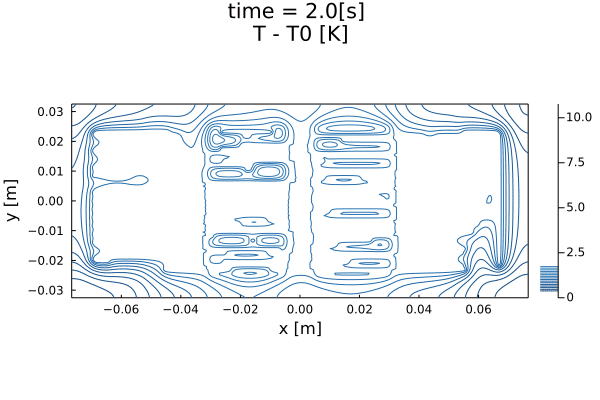

In [1470]:
Tmax = maximum(temperature(plate_hist[end-1])[:])
Tmin = 0.0
@gif for i = 1:1:length(plate_hist)
# @gif     for i = 1:1:1  
    
plot(temperature(plate_hist[i]),sys.grid,legend=true,color=cgrad(:RdBu,rev=true),clim=(Tmin,Tmax),line_z=0,xlabel="x [m]",ylabel="y [m]",title=string("time = ", round(plate_hist[i].t, digits=2), "[s] \n",  "T - T0 [K]"))
end

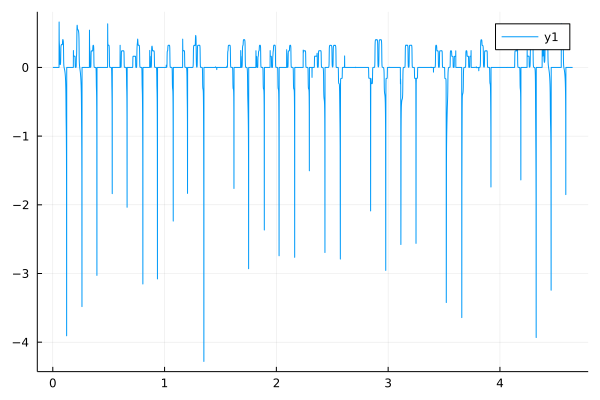

In [1471]:
plot(sys.qline[1].arccoord,sys_to_heatflux(sysfinal[end]))

In [1472]:
# @gif for i=1:1:1
#     Htmp = sys_to_Harray(sysfinal[i])
#     plot(ohp,fillalpha=0,linecolor=cgrad([:gold, :blue],rev=true),line_z=Htmp,xlabel="x ",ylabel="y ",border=:none,axis=nothing)
# end

┌ Info: Saved animation to 
│   fn = C:\Users\liyux\Documents\GitHub\ComputationalHeatTransfer.jl\src\tmp.gif
└ @ Plots C:\Users\liyux\.julia\packages\Plots\LSKOd\src\animation.jl:114


Plots.AnimatedGif("C:\\Users\\liyux\\Documents\\GitHub\\ComputationalHeatTransfer.jl\\src\\tmp.gif")
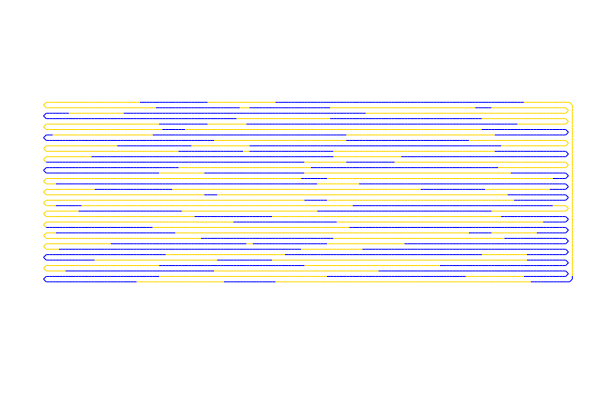

In [1473]:
@gif for i=1:1:length(sysfinal)
    Htmp = sys_to_Harray(sysfinal[i])
    plot(ohp,fillalpha=0,linecolor=cgrad([:gold, :blue],rev=true),line_z=Htmp,xlabel="x ",ylabel="y ",border=:none,axis=nothing)
end

In [1474]:
Htmp = sys_to_Harray(sysfinal[end])

5598-element Array{Float64,1}:
 4.6725477249706024
 4.6725477249706024
 4.6725477249706024
 4.6725477249706024
 4.6725477249706024
 4.6725477249706024
 4.6725477249706024
 4.6725477249706024
 4.6725477249706024
 4.6725477249706024
 4.6725477249706024
 4.6725477249706024
 4.6725477249706024
 ⋮
 4.6725477249706024
 4.6725477249706024
 4.6725477249706024
 4.6725477249706024
 4.6725477249706024
 4.6725477249706024
 4.6725477249706024
 4.6725477249706024
 4.6725477249706024
 4.6725477249706024
 4.6725477249706024
 4.6725477249706024

In [1475]:
ohp.x

5598-element Array{Float64,1}:
 0.06521424242424242
 0.06438300018821758
 0.06355175795219274
 0.0627205157161679
 0.061889273480143045
 0.061058031244118204
 0.060226789008093355
 0.059395546772068514
 0.058564304536043665
 0.057733062300018824
 0.05690182006399398
 0.056070577827969134
 0.055239335591944286
 ⋮
 0.066915
 0.066915
 0.066915
 0.066915
 0.066915
 0.066915
 0.066915
 0.066915
 0.066915
 0.066915
 0.066915
 0.06621424242424244

# plot the OHP

┌ Info: Saved animation to 
│   fn = C:\Users\liyux\Documents\GitHub\ComputationalHeatTransfer.jl\src\tmp.gif
└ @ Plots C:\Users\liyux\.julia\packages\Plots\LSKOd\src\animation.jl:114


Plots.AnimatedGif("C:\\Users\\liyux\\Documents\\GitHub\\ComputationalHeatTransfer.jl\\src\\tmp.gif")
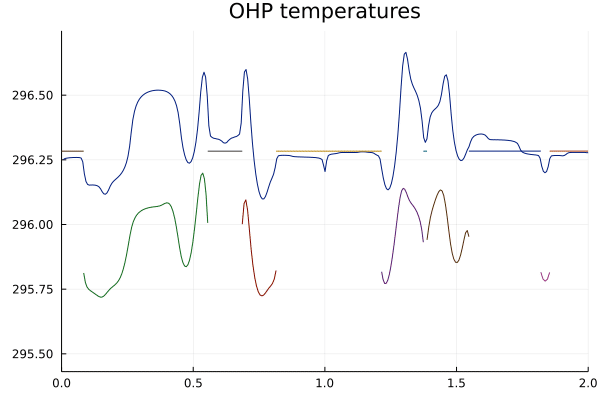

In [1476]:
@gif for ii=1:length(sysfinal)
     plot(sysfinal[ii],plottype="T",xlim=(0.0,2.0))
end

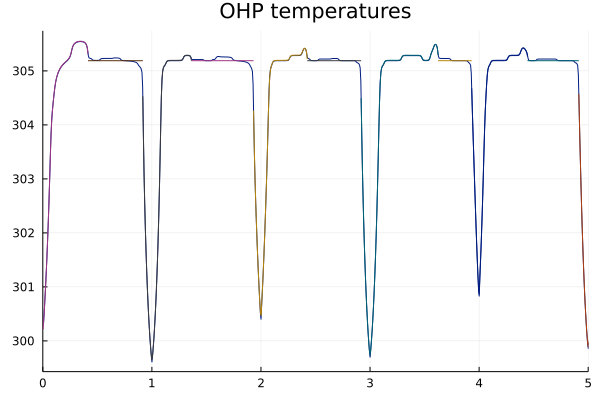

In [1477]:
plot(sysfinal[end],plottype="T",xlim=(0.0,5.0))

In [1478]:
maximum(sysfinal[end].liquid.θarrays[1]) * 295

305.381864040855

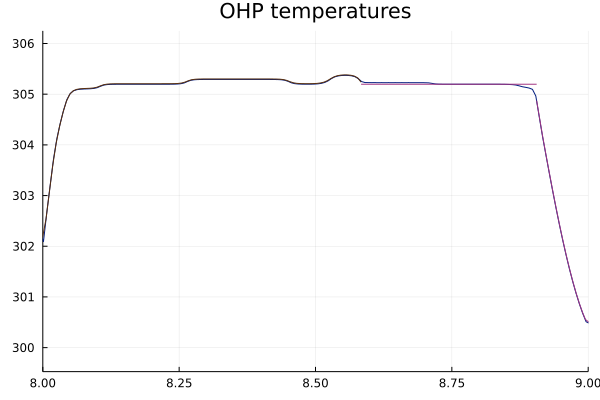

In [1479]:
plot(sysfinal[end-30],plottype="T",xlim=(8.0,9.0))

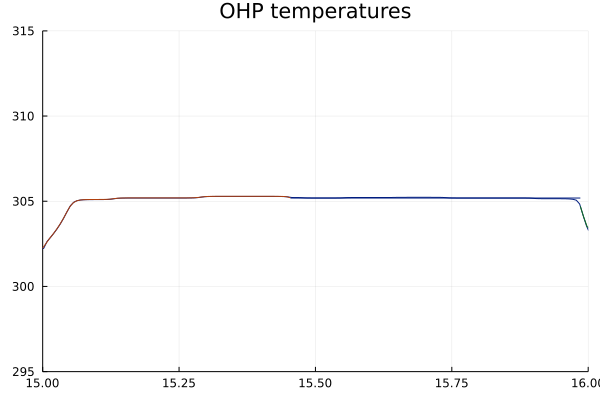

In [1480]:
plot(sysfinal[end-1],plottype="T",xlim=(15.0,16.0),ylim=(295.0,315.0))

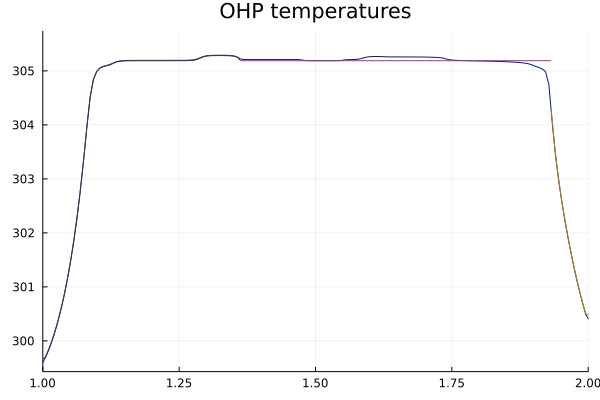

In [1481]:
plot(sysfinal[end-1],plottype="T",xlim=(1.0,2.0))

┌ Info: Saved animation to 
│   fn = C:\Users\liyux\Documents\GitHub\ComputationalHeatTransfer.jl\src\tmp.gif
└ @ Plots C:\Users\liyux\.julia\packages\Plots\LSKOd\src\animation.jl:114


Plots.AnimatedGif("C:\\Users\\liyux\\Documents\\GitHub\\ComputationalHeatTransfer.jl\\src\\tmp.gif")
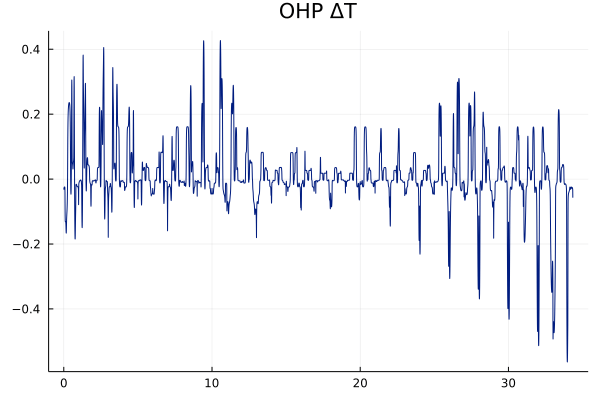

In [1482]:
@gif for ii=1:length(sysfinal)
    plot(sysfinal[ii],plottype="ΔT")
end

In [1483]:
# plate_hist, integrator_plate = load("plate_OHP_boiling.jld2", "plate_hist",  "integrator_plate")

In [1484]:
# tube_hist, integrator_tube = load("tube_OHP_boiling.jld2", "tube_hist",  "integrator_tube")

In [1485]:
sysfinal

151-element Array{Any,1}:
 PHPSystem(Tube(0.00656, 34.35, 1.0, 0.0, 0.001016949152542373, true), Evaporator([(1.0, 3.0)], [0.0]), Condenser(1.0, [(0.0, 1.0), (3.0, 4.0)], 0.0), Liquid(4.6725477249706024, 102.593344, 49.49747468305833, 205000.0, [(28.167620738860432, 28.537675584451303), (28.770103252849562, 29.098429932965566), (29.334107149649906, 29.438481956532485), (29.918054872849535, 30.245828230531508), (30.502888819522386, 30.781884741687154), (31.044794970724798, 31.3280206372877), (31.637658725439973, 32.088339557988576), (32.198154186824304, 32.46089496091681), (32.78295855010139, 33.180360837007456), (33.34675002034377, 33.44444274663087)  …  (23.002484410174734, 23.20957715564089), (23.583976562609173, 24.06156565049065), (24.147572287275114, 24.191777071062372), (24.74798030314365, 24.978256553768844), (25.301804710924927, 25.55387405623646), (25.877174602039613, 26.31152182402418), (26.4612608189065, 26.59969659050832), (26.61442601362097, 26.870490824892727), (27.030776

In [1486]:
save("plate_OHP_mediumlowH.jld2", "plate_hist", plate_hist, "integrator_plate", integrator_plate)

In [1487]:
save("tube_OHP_mediumlowH.jld2", "tube_hist", tube_hist, "integrator_tube",integrator_tube)

In [1488]:
inch = 2.54e-2;

# x = [-2.7inch,0.0,2.7inch];
# y = [0.0,0.0,0.0];

x = [0.0]
y = [0.0]

X =  VectorData(x,y);

In [1489]:
H = Regularize(X,cellsize(sys),I0=origin(sys.grid))
g = ScalarData(X);

In [1490]:
ghist = []
thist = []
for i = 1:length(plate_hist)
    H(g,temperature(plate_hist[i]))
    append!(ghist,deepcopy(g))
    append!(thist,plate_hist[i].t)
end

In [1491]:
RTDx,RTDy = load("RTD4.jld2","RTDx","RTDy")

([10.89866157, 14.34034417, 21.22370937, 37.8585086, 64.24474187, 96.36711281, 125.6214149, 152.581262, 182.4091778, 211.0898662, 247.2275335, 275.334608], [16.58279415, 20.15358253, 23.16569499, 25.33894001, 26.617514, 27.22537814, 27.38734721, 27.60554664, 27.82321258, 27.81787763, 28.03436988, 27.97333806])

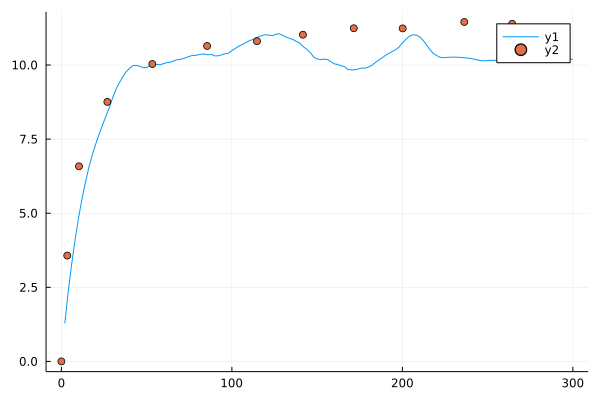

In [1492]:
plot(thist,ghist)
scatter!(RTDx .- RTDx[1],RTDy .- RTDy[1])

In [1493]:
rand(10)

10-element Array{Float64,1}:
 0.1939071139305737
 0.6365737860702658
 0.19224673153685856
 0.5945716614620264
 0.02082462296407317
 0.6303215600522489
 0.8230535767587581
 0.28126932662071247
 0.41706458737462504
 0.9709303562283971

In [1494]:
using CoolProp

In [1495]:
fluid_type = "butane"
Tᵥ = 295.0
Cpₗ = CoolProp.PropsSI("CPMASS","T",Tᵥ,"Q",0.0,fluid_type)
ρₗ  = CoolProp.PropsSI("D","T",Tᵥ,"Q",0.0,fluid_type)
μₗ  = CoolProp.PropsSI("V","T",Tᵥ,"Q",0.0,fluid_type)
Cpᵥ = CoolProp.PropsSI("CPMASS","T",Tᵥ,"Q",1.0,fluid_type)
ρᵥ  = CoolProp.PropsSI("D","T",Tᵥ,"Q",1.0,fluid_type)
μᵥ  = CoolProp.PropsSI("V","T",Tᵥ,"Q",1.0,fluid_type)

7.308457480329653e-6

In [1496]:
hₗ = 4.62e2
# Hₗ = 4*hₗ*d/(μₗ*Cpₗ)
# hₗ = 1e3

462.0

In [1497]:
para = 4*hₗ/(d*ρₗ*Cpₗ)

1.3230254212527746

In [1498]:
nondi_para = Hₗ

4.6725477249706024

In [1499]:
ρᵥ

5.619013384142316

In [1500]:
μₗ

0.00016322746825352366

In [1501]:
μₗ/ρₗ/d^2

0.2831486159429433

In [1199]:
Hₗ = 4*hₗ*d/(μₗ*Cpₗ)

4.6725477249706024

In [859]:
Tᵥ

295.0

In [863]:
nondi_T = t_to_nondi_t .* (LinRange(0.0,1.0,101))

nondi_Tᵥ = 1.0

nondi_Tresult = nondi_Tᵥ .+ 1/Tᵥ .* (1 .- exp.(-Hₗ .* (nondi_T .- nondi_T[1])))

di_Tresult = nondi_Tresult .* Tᵥ

101-element Array{Float64,1}:
 295.0
 295.013136266189
 295.02609997088854
 295.0388933809124
 295.0515187332967
 295.0639782356913
 295.0762740667459
 295.0884083764908
 295.1003832867128
 295.1122008913266
 295.1238632567405
 295.1353724222178
 295.1467304002339
   ⋮
 295.69175938870524
 295.69580851942544
 295.69980445968673
 295.703747908213
 295.70763955454976
 295.7114800791843
 295.71527015366496
 295.7190104407183
 295.7227015943654
 295.7263442600356
 295.7299390746799
 295.73348666688213

In [864]:
t = LinRange(0.0,1.0,101)

(Tᵥ + 1.0) .- exp.(-para .* (t .- t[1]))

101-element Array{Float64,1}:
 295.0
 295.0131431190958
 295.026113496612
 295.0389134029119
 295.0515450785188
 295.0640107345088
 295.07631255289755
 295.08845268702214
 295.10043326191806
 295.1122563746913
 295.1239240948853
 295.13543846484316
 295.1468015000654
   ⋮
 295.6919498316178
 295.6959985716683
 295.6999940986462
 295.70393711193714
 295.70782830173476
 295.7116683491615
 295.71545792638756
 295.71919769674884
 295.7228883148628
 295.7265304267434
 295.73012466991383
 295.7336716735182